In [1]:
import properties_searcher
import pandas as pd
import torch
import chemistry_vae_selfies
import importlib
import math
import torch.nn as nn
import time
import random
import selfies
import data_loader
import numpy as np
import matplotlib.pyplot as plt

In [2]:
list_of_properties = []

input_dim = 50 ### Size of the latent space
num_of_cycles = 1000### The number of hyperparameter searches you want to do, change accordingly
counter = 0

In [3]:
my_file = pd.read_csv('./datasets/PropsQM9/listprops.csv', index_col=None)##The file you want to train on, should contain SMILES reps, latent space reps and properties
my_file.dropna()


for i in range(len(my_file)):

    DipoleIn = my_file['dipole_moment'][i]
    GapIn = my_file['energy_gap'][i]
    SMILESCodeIn = my_file['smiles'][i]
    list_of_properties.append([SMILESCodeIn, GapIn, DipoleIn])

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

folder_path = "./datasets/"
file_name = "SelectedSMILES_QM9.txt"

full_path = folder_path + file_name

selfies_list, selfies_alphabet, largest_selfies_len, smiles_list, smiles_alphabet, largest_smiles_len = chemistry_vae_selfies.get_selfie_and_smiles_encodings_for_dataset(full_path)

selfies_alphabet = [
    "[O]",
    "[N]",
    "[Branch1]",
    "[F]",
    "[=C]",
    "[C]",
    "[=N]",
    "[=Branch1]",
    "[Ring2]",
    "[#Branch1]",
    "[=Branch2]",
    "[Branch2]",
    "[Ring1]",
    "[#Branch2]",
    "[#C]",
    "[nop]",
    "[=O]",
    "[#N]"
]

--> Translating SMILES to SELFIES...
Finished translating SMILES to SELFIES.
selfies aplhabet: ['[C]', '[#Branch1]', '[Ring1]', '[Branch2]', '[nop]', '[Branch1]', '[O]', '[=O]', '[=C]', '[#N]', '[=N]', '[F]', '[#C]', '[Ring2]', '[=Branch1]', '[=Branch2]', '[N]', '[#Branch2]']
smiles aplhabet: ['F', '(', '=', '4', 'N', '5', '#', '3', '1', 'C', '2', 'O', ')', ' ']


In [5]:
print(selfies_alphabet)

['[O]', '[N]', '[Branch1]', '[F]', '[=C]', '[C]', '[=N]', '[=Branch1]', '[Ring2]', '[#Branch1]', '[=Branch2]', '[Branch2]', '[Ring1]', '[#Branch2]', '[#C]', '[nop]', '[=O]', '[#N]']


In [6]:
# define source file location
file_to_load =  "../../selfies_saved_models_50/lr_0.002427375401692564_KLD_0.0364/"
# training file name encoder
training_file_nameE = "4950/E"
# training file name decoder
training_file_nameD = "4950/D"
# load data
#load_data_trained = file_to_load + training_file_nameE
# Alphabet has 18 letters, largest molecule is 21 letters. (build this as an output function later ... )
largest_selfies_len_dataset = largest_selfies_len
largest_smiles_len_dataset = largest_smiles_len

#in_dimension = len(selfies_alphabet)*largest_selfies_len
in_dimension = len(smiles_alphabet)*largest_smiles_len

# load the trained encoder
vae_encoder = torch.load(file_to_load + training_file_nameE, map_location=torch.device('cpu')) #, map_location=torch.device(device="cpu"))
#print(vae_encoder)

# load the trained decoder
vae_decoder = torch.load(file_to_load + training_file_nameD, map_location=torch.device('cpu')) #, map_location=torch.device(device="cpu"))
#print(vae_decoder)

In [7]:
def create_onehot_instance(selfie_input,largest_selfies_len,selfies_alphabet_in):

    inttest_hot, arraytest_hot = data_loader.selfies_to_hot(selfie_input,largest_selfies_len, selfies_alphabet_in)
    x = torch.from_numpy(arraytest_hot).flatten().float().unsqueeze(0)
    return x

In [8]:
def create_latent_space_vector(selfie_input,largest_selfies_len,selfies_alphabet_in):

    x = create_onehot_instance(selfie_input,largest_selfies_len,selfies_alphabet_in)

    z =set()
    vae_encoder.eval()
    vae_decoder.eval()
    z, mu, log_var = vae_encoder(x)

    return z.unsqueeze(0)

In [9]:
selfies_rep, latent_rep, props_used = properties_searcher.filter(list_of_properties, largest_selfies_len_dataset, selfies_alphabet, vae_encoder, vae_decoder)

selfies_list, selfies_alphabet, largest_selfies_len, smiles_list, smiles_alphabet, largest_smiles_len = chemistry_vae_selfies.get_selfie_and_smiles_encodings_for_dataset(full_path)

selfies_alphabet = [
    "[O]",
    "[N]",
    "[Branch1]",
    "[F]",
    "[=C]",
    "[C]",
    "[=N]",
    "[=Branch1]",
    "[Ring2]",
    "[#Branch1]",
    "[=Branch2]",
    "[Branch2]",
    "[Ring1]",
    "[#Branch2]",
    "[#C]",
    "[nop]",
    "[=O]",
    "[#N]"
]


[N][#C][C][N][C][Ring1][Ring1][C][C][C][Ring1][Ring2][C][Ring1][Ring2]
[O][C][=N][O][N][=C][Ring1][Branch1][O][C][=O]
[C][C][C][C][C][Ring1][Ring2][C][N][C][C][Ring1][Branch2][Ring1][Ring1]
[C][N][=C][O][C][=Branch1][C][=O][C][C][Ring1][=Branch1][N]
[C][C][Branch1][Ring1][C][O][C][Branch1][Ring1][C][O][C][#N]
[C][C][Branch1][C][C][C][C][=Branch1][C][=O][O][C][Ring1][#Branch1][=N]
[C][C][N][C][Branch1][Branch2][C][N][C][Ring1][=Branch1][Ring1][Ring2][C][#N]
[O][C][C][O][C][=Branch1][C][=O][N][C][C][Ring1][Ring1]
[O][=C][C][=C][N][C][C][C][Ring1][Ring2][=N][Ring1][#Branch1]
[N][C][Branch1][#Branch1][C][O][C][Ring1][Ring2][=N][C][C][N][Ring1][Ring1]
[C][C][N][C][=N][C][=Branch1][Ring2][=C][Ring1][Branch1][C][#C]
[O][=C][C][C][C][O][C][C][Ring1][#Branch1][O][Ring1][=Branch1]
[C][C][=Branch1][C][=O][C][C][Branch1][C][C][C][O][C][Ring1][Branch1]
[O][=C][C][=N][C][C][O][Ring1][Branch1]
[N][#C][C][Branch1][#Branch1][C][C][C][C][Ring1][Ring1][C][O][Ring1][#Branch1]
[C][C][=C][C][C][N][C][Ring1]

[C][C][C][N][C][C][=Branch1][C][=O][C][Ring1][#Branch1][Ring1][Branch1]
[C][O][C][C][Ring1][Ring2][N][C][C][O][C][Ring1][#Branch1][Ring1][Ring2]
[C][C][C][C][C][C][O][C][Ring1][#Branch1][C][Ring1][Branch1]
[C][C][C][Branch1][C][O][C][C][C][C][Ring1][=Branch1][O][Ring1][Branch1]
[C][C][Branch1][C][O][C][N][C][Ring1][Branch1][C][Ring1][Ring2][O]
[C][N][C][Branch1][Ring1][C][#N][C][Ring1][Branch1][C][C][O][Ring1][Ring1]
[C][C][=N][C][=C][Branch1][Ring2][C][C][#N][N][Ring1][Branch2]
[C][C][C][Ring1][Ring1][C][C][Branch1][=Branch1][C][C][C][Ring1][Ring2][C][Ring1][#Branch1]
[N][C][=Branch1][Branch2][=N][C][C][C][C][Ring1][Ring2][C][#N]
[C][C][C][C][C][C][Ring1][Branch1][Branch1][C][C][C][Ring1][#Branch1][Ring1][Branch1]
[O][C][C][C][N][C][C][Ring1][Branch1][Ring1][Ring1][C][=O]
[C][C][C][Branch1][Ring1][C][#C][C][Branch1][C][O][C][#N]
[C][C][Branch1][Ring1][C][O][C][C][C][Ring1][Ring1][C]
[C][C][C][C][C][C][Branch1][C][O][C][Ring1][#Branch1][O][Ring1][#Branch1]
[O][=C][C][N][C][C][Ring1][Ri

In [10]:
print(selfies_rep[1])

[O][C][=N][O][N][=C][Ring1][Branch1][O][C][=O]


In [11]:
train_size = round(len(latent_rep)*0.8)

one_hots =  properties_searcher.create_onehot_instance_many(selfies_rep, largest_selfies_len, selfies_alphabet)

energy_gaps = []
#start_time = time.time()                                                                                                                                                                               


latent_rep, log_var_rep = properties_searcher.gen_new_latent_space(one_hots, largest_selfies_len, selfies_alphabet, vae_encoder, vae_decoder)



latent_space_vectors_valid = [item[0].detach().squeeze(0) for item in latent_rep]
log_vars_valid = [item[0].detach().squeeze(0) for item in log_var_rep]
properties_training = [torch.tensor(property_vector) for property_vector in props_used]  # this will convert lists to tensors  

In [12]:
print(len(energy_gaps))

0


In [13]:
print(len(latent_space_vectors_valid))
print(len(log_vars_valid))

130251
130251


In [14]:
def min_max_normalize(tensor):
    min_val = torch.min(tensor)
    max_val = torch.max(tensor)
    normalized_tensor = (tensor - min_val) / (max_val - min_val)
    return normalized_tensor

In [15]:
for i in range(len(properties_training)):
    energy_gaps.append(props_used[i][0])



log_var2 = [math.e ** (-exponent) for exponent in log_vars_valid]


#log_vars_valid_normalise = (log_var2 - log_var2[(log_var2).argmin()]) / (log_var2[(log_var2).argmax()] - log_var2[(log_var2).argmin()])

In [16]:
normalized_tensor_list = [min_max_normalize(tensor) for tensor in log_var2]


In [17]:
log_var2[1]

tensor([  1.0030,  62.4291,   1.0044, 172.5106,   1.0016,   1.0034,  46.1116,
         35.6891,  74.9519,  60.5464,  94.3011,   1.0019,  52.5892, 428.2567,
          1.0033,   1.0010,   1.0015, 121.6374,   1.0022, 497.6276,  22.7625,
          1.0027, 102.7162, 145.3165,   1.0020,   1.0029,   1.0029,   1.0017,
          1.0037, 110.8610,   1.0035,   1.0014,   1.0025,   1.0028,  83.3380,
          1.0026, 151.8621,   1.0006,   1.0031, 119.2607, 406.2459,   1.0033,
          1.0036,   1.0053,   1.0022,   1.0018,   1.0029, 144.6758, 721.8091,
          1.0054])

In [18]:
len(normalized_tensor_list)

130251

In [19]:
import numpy as np
from scipy import stats

# Assuming 'energy_gaps' is a NumPy array or Python list containing the energy gap values in the latent space
# Before applying the Box-Cox transformation, ensure that all values are positive (you may add a constant if needed)

# Find the optimal value of lambda (power) for the transformation
optimal_lambda, _ = stats.boxcox(energy_gaps)

# Apply the Box-Cox transformation with the optimal lambda
transformed_energy_gaps = stats.boxcox(energy_gaps, lmbda=optimal_lambda)

# The transformed_energy_gaps will now have the modified distribution with pronounced extremes


(array([1.1000e+01, 3.5000e+01, 7.8000e+01, 2.1800e+02, 7.1100e+02,
        1.5180e+03, 2.4140e+03, 3.2050e+03, 4.2890e+03, 6.1330e+03,
        9.5890e+03, 1.2875e+04, 1.0439e+04, 8.5940e+03, 9.2250e+03,
        9.2550e+03, 9.3090e+03, 8.0290e+03, 6.7770e+03, 7.9060e+03,
        7.8950e+03, 6.1240e+03, 3.5270e+03, 1.2410e+03, 4.2800e+02,
        2.3200e+02, 1.2100e+02, 3.4000e+01, 1.5000e+01, 1.0000e+01,
        6.0000e+00, 2.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00,
        0.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([0.0983  , 0.108776, 0.119252, 0.129728, 0.140204, 0.15068 ,
        0.161156, 0.171632, 0.182108, 0.192584, 0.20306 , 0.213536,
        0.224012, 0.234488, 0.244964, 0.25544 , 0.265916, 0.276392,
        0.286868, 0.297344, 0.30782 , 0.318296, 0.328772, 0.339248,
        0.349724, 0.3602  , 0.370676, 0.381152

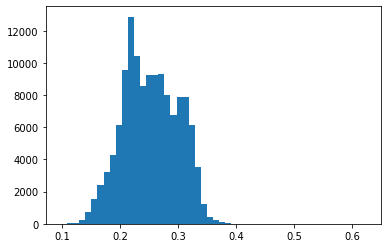

In [20]:
plt.hist(energy_gaps, bins = 50)

(array([1.0000e+00, 0.0000e+00, 0.0000e+00, 4.0000e+00, 2.0000e+00,
        4.0000e+00, 0.0000e+00, 4.0000e+00, 1.0000e+00, 3.0000e+00,
        9.0000e+00, 1.4000e+01, 1.3000e+01, 1.6000e+01, 1.6000e+01,
        2.1000e+01, 2.9000e+01, 3.9000e+01, 6.6000e+01, 7.7000e+01,
        1.2200e+02, 1.9500e+02, 2.8500e+02, 3.7500e+02, 5.6300e+02,
        6.8900e+02, 9.3100e+02, 1.1360e+03, 1.3210e+03, 1.7420e+03,
        2.0520e+03, 2.8330e+03, 3.7510e+03, 5.4220e+03, 7.9400e+03,
        1.0889e+04, 9.9820e+03, 8.7600e+03, 1.0397e+04, 1.1741e+04,
        1.2509e+04, 1.1382e+04, 1.4674e+04, 8.8310e+03, 1.2000e+03,
        1.8500e+02, 1.9000e+01, 4.0000e+00, 1.0000e+00, 1.0000e+00]),
 array([-9.48273994, -9.30351746, -9.12429497, -8.94507249, -8.76585001,
        -8.58662752, -8.40740504, -8.22818256, -8.04896007, -7.86973759,
        -7.69051511, -7.51129262, -7.33207014, -7.15284766, -6.97362517,
        -6.79440269, -6.61518021, -6.43595772, -6.25673524, -6.07751275,
        -5.89829027, -5.71

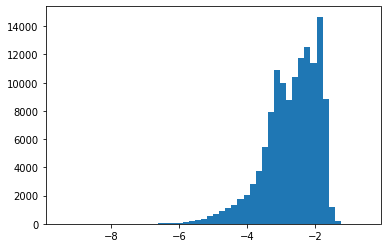

In [21]:
plt.hist(transformed_energy_gaps, bins = 50)

In [22]:
transformed_energy_gaps = transformed_energy_gaps.tolist()

In [23]:
log_var_rep_train = normalized_tensor_list[:train_size]
log_var_rep_test = normalized_tensor_list[train_size:]



latents_train = latent_space_vectors_valid[:train_size]
latents_test = latent_space_vectors_valid[train_size:]

props_train = energy_gaps[:train_size]
props_test = energy_gaps[train_size:]

In [24]:
train_latent_space_tensor, test_latent_space_tensor, train_properties_tensor, test_properties_tensor = properties_searcher.make_tensors(latents_train, latents_test, props_train, props_test)

log_var_rep_train = torch.stack(log_var_rep_train)
log_var_rep_test = torch.stack(log_var_rep_test)

train_latent_space_tensor = train_latent_space_tensor.view(-1, input_dim)
test_latent_space_tensor = test_latent_space_tensor.view(-1, input_dim)
log_var_rep_train_tensor = log_var_rep_train.view(-1, input_dim)
log_var_rep_test_tensor = log_var_rep_test.view(-1, input_dim)


print(log_var_rep_train_tensor.size())
print(train_latent_space_tensor.size())

train_data_with_variances = torch.cat((train_latent_space_tensor, log_var_rep_train_tensor), dim=1)

torch.Size([104201, 50])
torch.Size([104201, 50])


In [25]:
print(log_var_rep_test_tensor[1])

tensor([1.7726e-06, 1.1489e-01, 1.4117e-06, 2.5816e-01, 1.7405e-06, 1.9683e-06,
        1.0315e-01, 7.5741e-02, 2.0485e-01, 1.0338e-01, 1.8468e-01, 2.9428e-06,
        1.1422e-01, 1.0000e+00, 1.8677e-06, 2.0997e-06, 2.2318e-06, 2.0242e-01,
        1.6539e-06, 8.1967e-01, 4.1343e-02, 1.5057e-06, 2.0790e-01, 2.2071e-01,
        3.0838e-06, 2.3850e-06, 3.2229e-08, 1.9292e-06, 1.0324e-06, 6.8485e-01,
        1.4333e-06, 2.7315e-06, 1.9831e-06, 1.2227e-06, 1.2890e-01, 2.0326e-06,
        3.7450e-01, 2.4115e-06, 1.2824e-06, 1.9539e-01, 3.0725e-01, 1.4294e-06,
        1.2549e-06, 0.0000e+00, 3.2300e-06, 2.2040e-06, 1.4941e-06, 2.3484e-01,
        3.8199e-01, 1.1385e-07])


In [26]:
print(len(train_data_with_variances))

104201


In [27]:
print(len(log_var_rep_train_tensor))
print(len(train_latent_space_tensor))

104201
104201


In [28]:
print(len(log_var_rep_train_tensor))


absolute_average = torch.mean(torch.abs(log_var_rep_test_tensor), dim=0)



104201


In [29]:
var_tnsr = absolute_average**2

In [30]:
importlib.reload(properties_searcher)


<module 'properties_searcher' from '/users/sgccook3/DM_chems/VAE_sandbox/updated_juri/properties_searcher.py'>

(array([1.1000e+01, 3.5000e+01, 7.8000e+01, 2.1800e+02, 7.1100e+02,
        1.5180e+03, 2.4140e+03, 3.2050e+03, 4.2890e+03, 6.1330e+03,
        9.5890e+03, 1.2875e+04, 1.0439e+04, 8.5940e+03, 9.2250e+03,
        9.2550e+03, 9.3090e+03, 8.0290e+03, 6.7770e+03, 7.9060e+03,
        7.8950e+03, 6.1240e+03, 3.5270e+03, 1.2410e+03, 4.2800e+02,
        2.3200e+02, 1.2100e+02, 3.4000e+01, 1.5000e+01, 1.0000e+01,
        6.0000e+00, 2.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00,
        0.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([0.0983  , 0.108776, 0.119252, 0.129728, 0.140204, 0.15068 ,
        0.161156, 0.171632, 0.182108, 0.192584, 0.20306 , 0.213536,
        0.224012, 0.234488, 0.244964, 0.25544 , 0.265916, 0.276392,
        0.286868, 0.297344, 0.30782 , 0.318296, 0.328772, 0.339248,
        0.349724, 0.3602  , 0.370676, 0.381152

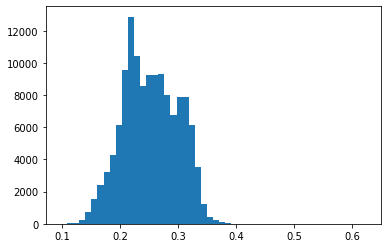

In [33]:
plt.hist(energy_gaps, bins = 50)

In [44]:
counter = 0

vector_lowE_train = []
properties_lowE_train = []

for i in range(len(train_latent_space_tensor)):
    if energy_gaps[i] <0.16:
        vector_lowE_train.append(train_latent_space_tensor[i])
        properties_lowE_train.append(train_properties_tensor[i])

print(len(vector_lowE_train))
print(len(properties_lowE_train))

1925
1925


In [45]:
properties_lowE_train = torch.tensor(properties_lowE_train)
vector_lowE_train = torch.stack(vector_lowE_train)

vector_lowE_train = vector_lowE_train.view(-1, input_dim)


In [276]:
bestr2 = 0
num_of_cycles = 1


for i in range(num_of_cycles):
            # Sample input dimensions for 100,000 compounds represented by 25 numbers
        hidden_dim = 1024 #random.choice([512, 1024, 2048])  # You can increase the hidden dimensions for more complexity
        prop_hidden_dim = int(hidden_dim/2)  # You can adjust this based on the complexity of the task
        prop_pred_activation = 'leaky_relu' #random.choice(['relu', 'leaky_relu'])
        prop_pred_dropout = 0#random.choice([0, 0.1, 0.2])
        prop_pred_depth = 8#random.choice([4,5,6])
        prop_growth_factor = 0.4#random.choice([0.4, 0.5, 0.6])
        lr_random = 0.0005#random.choice([0.001, 0.0005, 0.0001])
        epochs = 50
        batch_size = 64  # You can adjust this based on your hardware and dataset size






        # Instantiate the model with hyperparameters
        model = properties_searcher.PropertyRegressionModel(input_dim, hidden_dim, prop_hidden_dim, prop_pred_activation, prop_pred_dropout, prop_pred_depth, prop_growth_factor, var_tnsr)

        # Define your loss function (e.g., Mean Squared Error)
        loss_function = nn.MSELoss()

        # Define your optimizer (e.g., Adam)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr_random)   
        decay_step_size = 5  # Adjust this as per your preference
        decay_gamma = 0.75     # Adjust this as per your preference
        scheduler = properties_searcher.StepLR(optimizer, step_size=decay_step_size, gamma=decay_gamma)

        # Split the training data and properties into batches
        train_data_batches = train_latent_space_tensor.split(batch_size)
        train_props_batches = train_properties_tensor.split(batch_size)
        latent_variances_batch = log_var_rep_train_tensor.split(batch_size)
        #print(len(latent_variances_batch[2][1]))


        


###

        for epoch in range(epochs):

            start_time = time.time()

            optimizer.zero_grad()
            predictions = model(train_latent_space_tensor)
            pred_xtreme = model(vector_lowE_train)
            loss = loss_function(predictions.squeeze(), train_properties_tensor)
            loss_xtreme = loss_function(pred_xtreme.squeeze(), properties_lowE_train)
            loss - loss+ loss_xtreme
            loss.backward()
            optimizer.step()
            scheduler.step()

            
            

            total_loss = 0.0

            # Iterate through batches
            for data_batch, props_batch in zip(train_data_batches, train_props_batches):

                # Concatenate the latent space tensor and variances tensor for this batch

                optimizer.zero_grad()
                predictions = model(data_batch)  # Pass the combined tensor as input
                loss = loss_function(predictions.squeeze(), props_batch)
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

                

                # Update the learning rate
            scheduler.step()

                # Calculate average loss for the epoch
            avg_loss = total_loss / len(train_data_batches)
            end_time = time.time()

            epoch_duration = end_time - start_time

            print(f"Epoch {epoch}/{epochs} - Duration: {epoch_duration:.2f} seconds")



###

            with torch.no_grad():
                test_predictions = model(test_latent_space_tensor)
            y_pred = test_predictions
            y_test = props_test

            mse, mae, r2 = properties_searcher.stats(y_pred, y_test)
            if r2>bestr2:
                 bestr2 = r2


            print('r2:',r2, 'best r2:', bestr2, 'loss:', avg_loss)

            


Epoch 0/50 - Duration: 32.02 seconds
r2: 0.6000887721760139 best r2: 0.6000887721760139 loss: 0.0007690735513677002
Epoch 1/50 - Duration: 30.88 seconds
r2: 0.7195322801761251 best r2: 0.7195322801761251 loss: 0.00042704139533517006
Epoch 2/50 - Duration: 31.22 seconds
r2: 0.7837799371039016 best r2: 0.7837799371039016 loss: 0.00032405730032931187
Epoch 3/50 - Duration: 30.64 seconds
r2: 0.830208531281768 best r2: 0.830208531281768 loss: 0.0002686488044111529
Epoch 4/50 - Duration: 31.62 seconds
r2: 0.8543110046815473 best r2: 0.8543110046815473 loss: 0.00023197101013379187
Epoch 5/50 - Duration: 30.74 seconds
r2: 0.8651143389797686 best r2: 0.8651143389797686 loss: 0.00018472044057896825
Epoch 6/50 - Duration: 30.92 seconds
r2: 0.875779917313015 best r2: 0.875779917313015 loss: 0.0001586236636936316
Epoch 7/50 - Duration: 30.17 seconds
r2: 0.881364851607747 best r2: 0.881364851607747 loss: 0.00013090570300656765
Epoch 8/50 - Duration: 31.69 seconds
r2: 0.8856578380972304 best r2: 0.88

In [279]:
segmentedr2 = []

r2_len = round(len(test_latent_space_tensor)/100)
r2_counter = 0


for i in range(100):
    r2_counter2 = r2_counter +r2_len
    with torch.no_grad():
        test_predictions_loop = model(test_latent_space_tensor[r2_counter:r2_counter2])
        mse, mae, r2 = properties_searcher.stats(test_predictions_loop, props_test[r2_counter:r2_counter2])
        segmentedr2.append(r2)
    r2_counter = r2_counter + r2_len



In [280]:
for i in range(len(segmentedr2)):

    print('r2 number:', i, 'value:', segmentedr2[i])

r2 number: 0 value: 0.8644660138291406
r2 number: 1 value: 0.9106874492668238
r2 number: 2 value: 0.9085318896137928
r2 number: 3 value: 0.897190786487879
r2 number: 4 value: 0.9355214504826841
r2 number: 5 value: 0.9052082327305211
r2 number: 6 value: 0.9037798552367542
r2 number: 7 value: 0.9098568495623548
r2 number: 8 value: 0.9297521403083364
r2 number: 9 value: 0.8873587678115111
r2 number: 10 value: 0.9149200136061927
r2 number: 11 value: 0.9029102509187906
r2 number: 12 value: 0.9084780794415382
r2 number: 13 value: 0.9080062273563877
r2 number: 14 value: 0.9005743807696042
r2 number: 15 value: 0.9234009404129389
r2 number: 16 value: 0.9324720760882748
r2 number: 17 value: 0.8976399207996291
r2 number: 18 value: 0.9328675509201201
r2 number: 19 value: 0.8850604101727276
r2 number: 20 value: 0.8988671622280051
r2 number: 21 value: 0.9065687132390949
r2 number: 22 value: 0.9052657678991786
r2 number: 23 value: 0.8666921603753378
r2 number: 24 value: 0.9063258688482386
r2 number: 

100


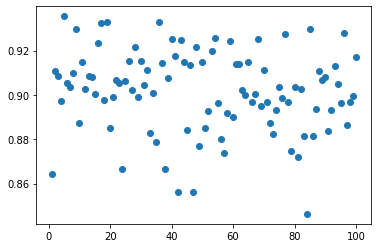

In [281]:
percentile = list(range(1, 101))

print(len(segmentedr2))
plt.scatter(percentile, segmentedr2)

In [139]:
y_pred_list = []

for i in range(len(y_pred)):
    y_pred_list.append(y_pred[i][0].tolist())


print(y_pred_list[1])

0.3370036780834198


In [51]:
#xfm_test = inv_boxcox(y_test, optimal_lambda[train_size:])
#xfm_pred = inv_boxcox(y_pred_list, optimal_lambda[train_size:])



In [141]:
print(bestr2)

0.8926186349205263


In [142]:
for i in range(20):
    num = i*1000

    print("Actual:", y_test[num], "predicted:", y_pred_list[num])


Actual: 0.2933 predicted: 0.28374776244163513
Actual: 0.3012 predicted: 0.29848214983940125
Actual: 0.3078 predicted: 0.2955326735973358
Actual: 0.3142 predicted: 0.310844749212265
Actual: 0.2044 predicted: 0.1763433814048767
Actual: 0.2849 predicted: 0.24801570177078247
Actual: 0.2976 predicted: 0.3113061785697937
Actual: 0.2091 predicted: 0.1908794343471527
Actual: 0.2211 predicted: 0.20541688799858093
Actual: 0.1755 predicted: 0.1815360188484192
Actual: 0.2415 predicted: 0.23048046231269836
Actual: 0.2487 predicted: 0.2207556664943695
Actual: 0.2426 predicted: 0.23602432012557983
Actual: 0.2889 predicted: 0.2776135802268982
Actual: 0.2044 predicted: 0.2152557671070099
Actual: 0.2616 predicted: 0.24810555577278137
Actual: 0.2794 predicted: 0.2623704671859741
Actual: 0.1751 predicted: 0.16010448336601257
Actual: 0.3064 predicted: 0.29547181725502014
Actual: 0.3239 predicted: 0.3153720200061798


In [232]:
model2 = torch.load("../../property_hyperparams/0.9137921656311221")

with torch.no_grad():
    test_predictions = model(test_latent_space_tensor)
predicted_values = test_predictions
actual_values = props_test



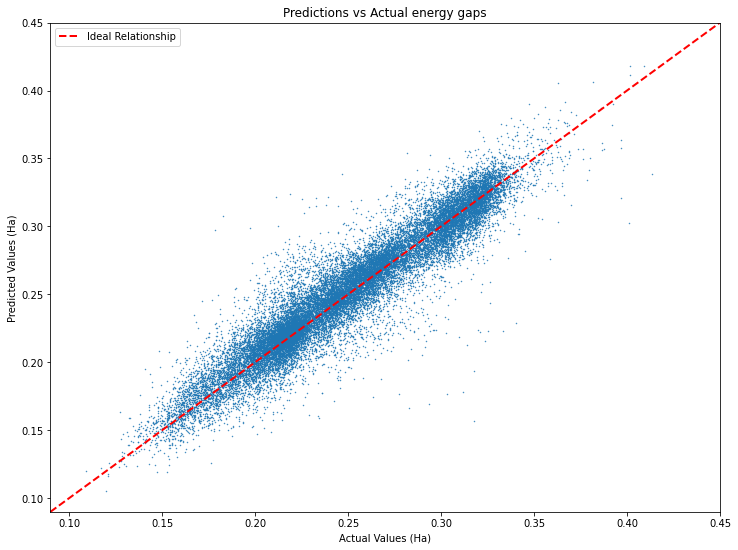

In [158]:
import matplotlib.pyplot as plt

# Assuming 'xfm_test' and 'xfm_pred' are NumPy arrays or Python lists containing the actual and predicted values, respectively.

# Set the figure size
plt.figure(figsize=(12, 9))  # Width=8 inches, Height=6 inches

plt.scatter(actual_values, predicted_values, s=0.2)  # s is the size of the scatter points (optional)
plt.xlabel('Actual Values (Ha)')
plt.ylabel('Predicted Values (Ha)')
plt.title('Predictions vs Actual energy gaps')

# Set the y-axis maximum to 0.5
plt.ylim(0.09, 0.45)
plt.xlim(0.09, 0.45)

# Draw the straight line representing the ideal relationship (y = x)
plt.plot([0, 0.5], [0, 0.5], color='red', linestyle='--', linewidth=2, label='Ideal Relationship')

plt.legend()
plt.show()



In [252]:
minimum_index = (props_test.index(min(props_test)))
pred_min_index = (pred_values_list.index(min(pred_values_list)))

In [254]:
min_selfie = (selfies_list[minimum_index+train_size])
print(minimum_index, pred_min_index)

5457 20156


In [263]:
my_list = props_test

# Get a list of tuples (value, index) and sort it based on values
sorted_list = sorted((value, index) for index, value in enumerate(my_list))

# Initialize a list to store the indexes of the 10 lowest values
lowest_indexes = []

# Iterate through the first 10 elements in the sorted list and extract the indexes
for _, index in sorted_list[:10]:
    lowest_indexes.append(index)

print("Indexes of the 10 lowest values:", lowest_indexes)


Indexes of the 10 lowest values: [5457, 14362, 5883, 2283, 21169, 4092, 10585, 10813, 23177, 6243]


In [271]:
for i in range(10):
    print(pred_values_list[lowest_indexes2[i]]*24)

-1.0644695162773132
2.6208409667015076
2.80664724111557
2.881091594696045
2.8985034227371216
2.9085161089897156
2.9156439900398254
2.936692535877228
3.0413882732391357
3.045706272125244


In [267]:
my_list = pred_values_list

# Get a list of tuples (value, index) and sort it based on values
sorted_list = sorted((value, index) for index, value in enumerate(my_list))

# Initialize a list to store the indexes of the 10 lowest values
lowest_indexes2 = []

# Iterate through the first 10 elements in the sorted list and extract the indexes
for _, index in sorted_list[:10]:
    lowest_indexes2.append(index)

print("Indexes of the 10 lowest values:", lowest_indexes2)


Indexes of the 10 lowest values: [20156, 4092, 10585, 5457, 14362, 5883, 18920, 23177, 10813, 7161]


In [265]:
pred_selfies_low = []
actual_selfies_low = []


for i in range(len(lowest_indexes)):
    pred_selfies_low.append(selfies_rep[train_size+lowest_indexes2[i]])
    actual_selfies_low.append(selfies_rep[train_size+lowest_indexes[i]])



In [266]:
print(pred_selfies_low)
print(actual_selfies_low)

['[C][C][C][C][=Branch1][C][=O][C][Ring1][Branch1][C][Ring1][Branch1][Branch1][C][C][O]', '[C][C][C][C][Ring1][Ring1][N][C][C][Ring1][Branch1][N][=C][Ring1][Branch2][Ring1][Branch1]', '[O][=C][C][O][C][C][=Branch1][C][=O][C][Ring1][#Branch1][=O]', '[C][C][C][C][Ring1][Ring1][C][=C][C][Ring1][=Branch1][N][Ring1][=Branch1][C][Ring1][Branch1]', '[O][C][C][C][Ring1][Ring1][C][=C][C][Ring1][=Branch1][C][Ring1][=Branch1][C][Ring1][Branch1]', '[C][C][C][C][Ring1][Ring1][C][=C][C][Ring1][=Branch1][C][Ring1][=Branch1][C][Ring1][Branch1]', '[O][=C][C][N][C][C][=Branch1][C][=O][C][Ring1][#Branch1][=O]', '[O][=C][C][C][=C][C][=Branch1][C][=O][C][Ring1][#Branch1][=O]', '[N][N][=N][C][=C][C][=N][C][=C][Ring1][=Branch2][Ring1][Branch1]', '[O][=C][C][=C][C][=Branch1][C][=O][C][C][Ring1][=Branch1][=O]']
['[C][C][C][C][Ring1][Ring1][C][=C][C][Ring1][=Branch1][N][Ring1][=Branch1][C][Ring1][Branch1]', '[O][C][C][C][Ring1][Ring1][C][=C][C][Ring1][=Branch1][C][Ring1][=Branch1][C][Ring1][Branch1]', '[C][C][C

In [250]:
selfies.decoder(min_selfie)

'OCC1C2CC1(O2)C=O'

In [210]:
test = test_predictions.tolist()


pred_values_list = []

for i in range(len(test)):

    pred_values_list.append(test[i][0])

In [208]:
print(min(test_predictions))

tensor([-0.0444])


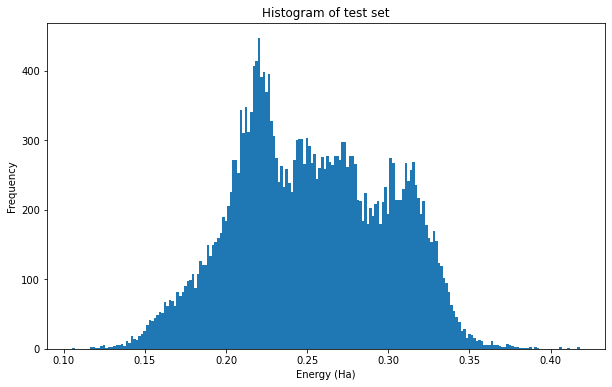

In [212]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'y_pred' is the tensor array you want to plot
# Convert the tensor to a NumPy array
numpy_array = props_test  # If 'y_pred' is a TensorFlow tensor
# numpy_array = y_pred.detach().numpy()  # If 'y_pred' is a PyTorch tensor

# Generate the histogram
plt.figure(figsize=(10, 6))  # Optional: Set the figure size

# Assuming 'numpy_array' is 1-dimensional (a vector)
plt.hist(numpy_array, bins=200)  # You can adjust the number of bins as needed
plt.xlabel('Energy (Ha)')
plt.ylabel('Frequency')
plt.title('Histogram of test set')

plt.show()


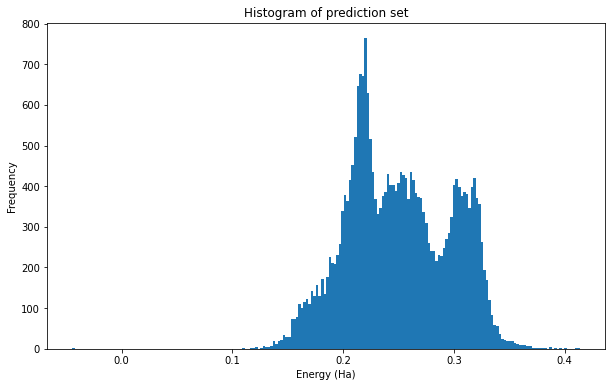

In [213]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'y_pred' is the tensor array you want to plot
# Convert the tensor to a NumPy array
numpy_array = pred_values_list  # If 'y_pred' is a TensorFlow tensor
# numpy_array = y_pred.detach().numpy()  # If 'y_pred' is a PyTorch tensor

# Generate the histogram
plt.figure(figsize=(10, 6))  # Optional: Set the figure size

# Assuming 'numpy_array' is 1-dimensional (a vector)
plt.hist(numpy_array, bins=200)  # You can adjust the number of bins as needed
plt.xlabel('Energy (Ha)')
plt.ylabel('Frequency')
plt.title('Histogram of prediction set')
plt.show()


In [221]:
print(len(props_test))
print(len(pred_values_list))

26050
26050


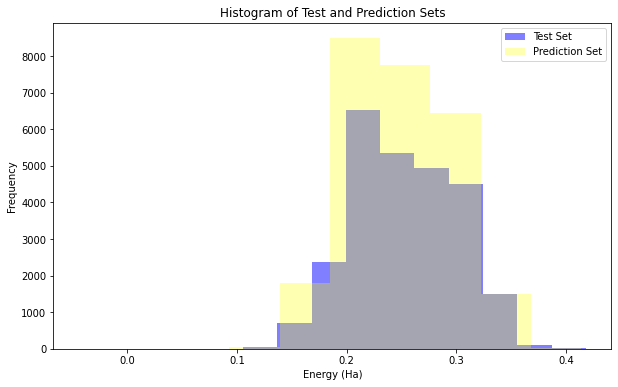

In [231]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'y_test' and 'predicted_values' are the tensor arrays you want to plot
# Convert the tensors to NumPy arrays
numpy_array_test = props_test  # If 'y_test' is a TensorFlow tensor
numpy_array_pred = pred_values_list  # If 'predicted_values' is a TensorFlow tensor
# numpy_array_test = y_test.detach().numpy()  # If 'y_test' is a PyTorch tensor
# numpy_array_pred = predicted_values.detach().numpy()  # If 'predicted_values' is a PyTorch tensor

# Generate the histogram
plt.figure(figsize=(10, 6))  # Optional: Set the figure size

# Assuming 'numpy_array_test' and 'numpy_array_pred' are 1-dimensional (vectors)
plt.hist(numpy_array_test, bins=10, alpha=0.5, label='Test Set', color='blue')  # Set color for Test Set histogram
plt.hist(numpy_array_pred, bins=10, alpha=0.3, label='Prediction Set', color='yellow')  # Set color for Prediction Set histogram

plt.xlabel('Energy (Ha)')
plt.ylabel('Frequency')
plt.title('Histogram of Test and Prediction Sets')
plt.legend()

plt.show()


